# Bike Sales Analysis Project

This project is an exploratory analysis of bike sales data across Europe. The main goal is to uncover trends and patterns related to customer demographics, product categories, geographic regions, and key sales metrics such as revenue, profit, and quantity sold.

The dataset used in this analysis was obtained from [Kaggle](https://www.kaggle.com/datasets/sadiqshah/bike-sales-in-europe/data) and contains detailed transaction-level information about bike-related products, customer profiles, and sales performance.

## 📊 Dataset Overview

The dataset includes the following columns:

- **Date**: The full date of the transaction (YYYY-MM-DD format).
- **Day**: The day of the month the transaction occurred.
- **Month**: The name of the month the transaction occurred.
- **Year**: The year the transaction occurred.
- **Customer_Age**: Age of the customer at the time of purchase.
- **Age_Group**: Age category of the customer (e.g., Youth (<25), Adults (25–49), Seniors (50+)).
- **Customer_Gender**: Gender of the customer (M or F).
- **Country**: Country where the transaction occurred.
- **State**: State or region within the country.
- **Product_Category**: High-level category of the product (e.g., Bikes, Accessories, Clothing).
- **Sub_Category**: More specific category under the product category (e.g., Helmets, Tires, Jerseys).
- **Product**: The name of the product purchased.
- **Order_Quantity**: Number of units ordered.
- **Unit_Cost**: Cost per unit of the product.
- **Unit_Price**: Sale price per unit of the product.
- **Profit**: Total profit from the transaction.
- **Cost**: Total cost for the transaction (Order_Quantity × Unit_Cost).
- **Revenue**: Total revenue from the transaction (Order_Quantity × Unit_Price).


In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pycountry
import geopandas as gpd

sns.set_style("whitegrid")  # Options: white, dark, whitegrid, darkgrid, ticks
palette = sns.color_palette("Set2")  # Options: deep, muted, bright, pastel, dark, colorblind, or custom palettes
sns.set_palette(palette)
plt.style.use("seaborn-v0_8-whitegrid")  # You can try 'ggplot', 'fivethirtyeight', etc.


In [2]:
df = pd.read_csv('../data/sales_data.csv')

In [3]:
df.head()

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113036 entries, 0 to 113035
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Date              113036 non-null  object
 1   Day               113036 non-null  int64 
 2   Month             113036 non-null  object
 3   Year              113036 non-null  int64 
 4   Customer_Age      113036 non-null  int64 
 5   Age_Group         113036 non-null  object
 6   Customer_Gender   113036 non-null  object
 7   Country           113036 non-null  object
 8   State             113036 non-null  object
 9   Product_Category  113036 non-null  object
 10  Sub_Category      113036 non-null  object
 11  Product           113036 non-null  object
 12  Order_Quantity    113036 non-null  int64 
 13  Unit_Cost         113036 non-null  int64 
 14  Unit_Price        113036 non-null  int64 
 15  Profit            113036 non-null  int64 
 16  Cost              113036 non-null  int

In [5]:
df.describe()

,Day,Year,Customer_Age,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
count,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000,113036.000000
mean,15.665753,2014.401739,35.919212,11.901660,267.296366,452.938427,285.051665,469.318695,754.370360
std,8.781567,1.272510,11.021936,9.561857,549.835483,922.071219,453.887443,884.866118,1309.094674
min,1.000000,2011.000000,17.000000,1.000000,1.000000,2.000000,-30.000000,1.000000,2.000000
25%,8.000000,2013.000000,28.000000,2.000000,2.000000,5.000000,29.000000,28.000000,63.000000
50%,16.000000,2014.000000,35.000000,10.000000,9.000000,24.000000,101.000000,108.000000,223.000000
75%,23.000000,2016.000000,43.000000,20.000000,42.000000,70.000000,358.000000,432.000000,800.000000
max,31.000000,2016.000000,87.000000,32.000000,2171.000000,3578.000000,15096.000000,42978.000000,58074.000000


In [6]:
#Rename columns
df.columns = [col.lower() for col in df.columns]

In [7]:
df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113036 entries, 0 to 113035
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   date              113036 non-null  datetime64[ns]
 1   day               113036 non-null  int64         
 2   month             113036 non-null  object        
 3   year              113036 non-null  int64         
 4   customer_age      113036 non-null  int64         
 5   age_group         113036 non-null  object        
 6   customer_gender   113036 non-null  object        
 7   country           113036 non-null  object        
 8   state             113036 non-null  object        
 9   product_category  113036 non-null  object        
 10  sub_category      113036 non-null  object        
 11  product           113036 non-null  object        
 12  order_quantity    113036 non-null  int64         
 13  unit_cost         113036 non-null  int64         
 14  unit

## 2 - Sales over time

In [9]:
daily_sales = df[['date','order_quantity']].groupby('date').sum()

In [10]:
# Lets apply a moving average to smooth the sales data
daily_sales['moving_average_30d'] = daily_sales.rolling(window="30D").mean()

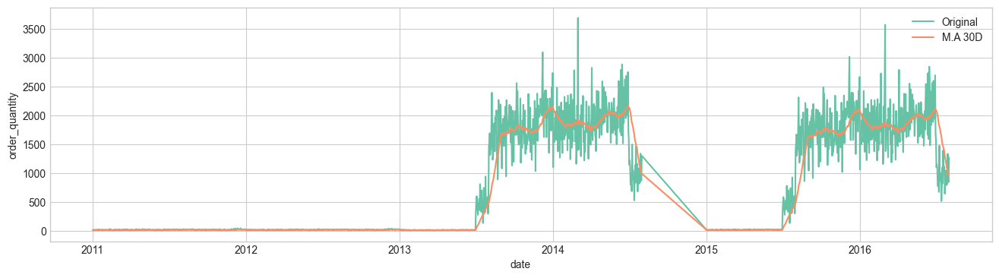

In [11]:
plt.figure(figsize = (16,4))
sns.lineplot(data = daily_sales, x = 'date', y='order_quantity', label = 'Original')
sns.lineplot(data = daily_sales, x = 'date', y='moving_average_30d', label = 'M.A 30D')
plt.show()

- Começo dos anos possuia poucas vendas. Em 2013 a empresa cresceu, se mantendo ativa até meados de 2014, decaindo pra quase zero em 2015 e voltando a escalar no segundo semestre.
- Dúvida: O que aconteceu no segundo semestre de 2014 para termos esse vazio nos dados?
- Parece existir um padrão sazonal nos anos de 2013 e 2015, com uma trend muito parecida (analisando as médias móveis de 30 dias)

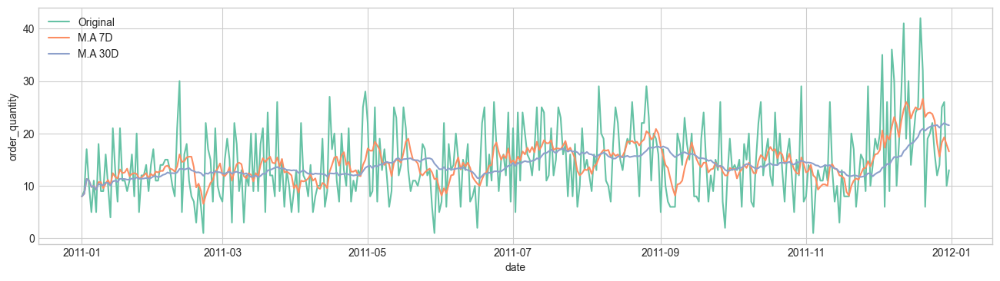

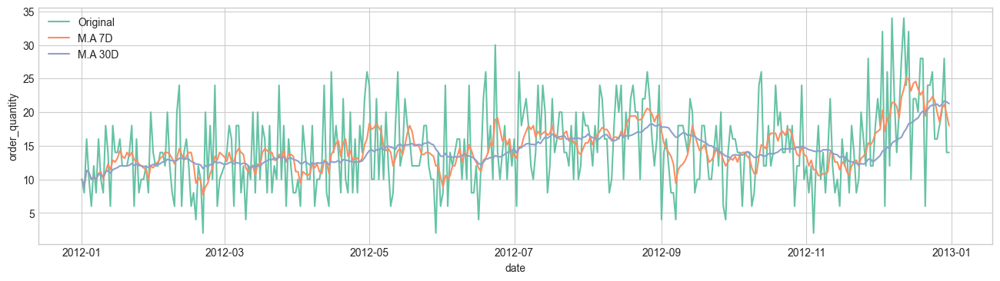

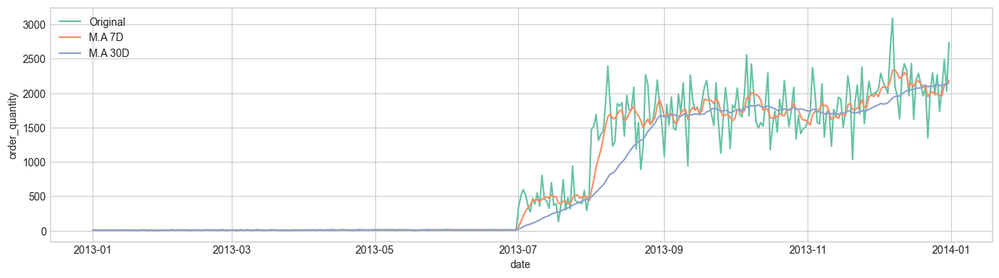

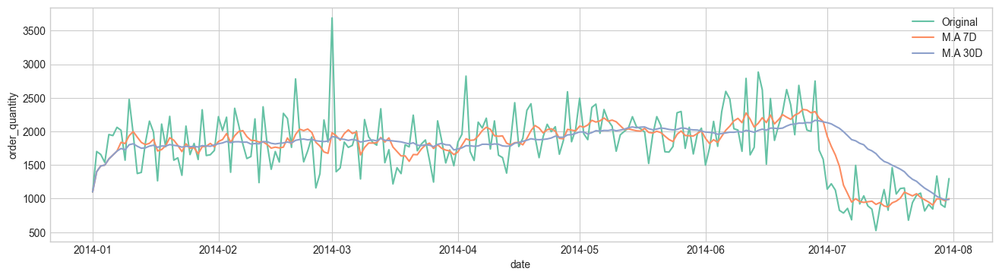

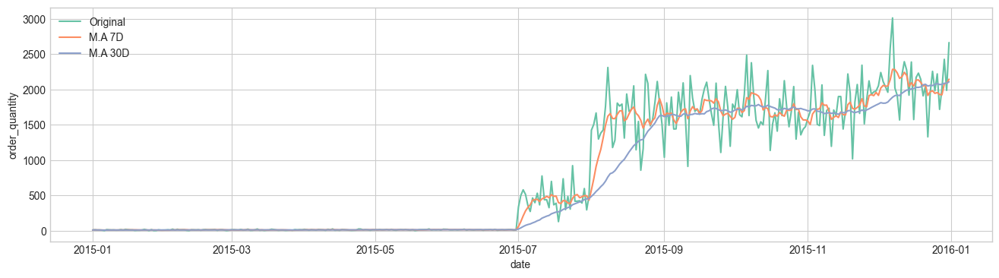

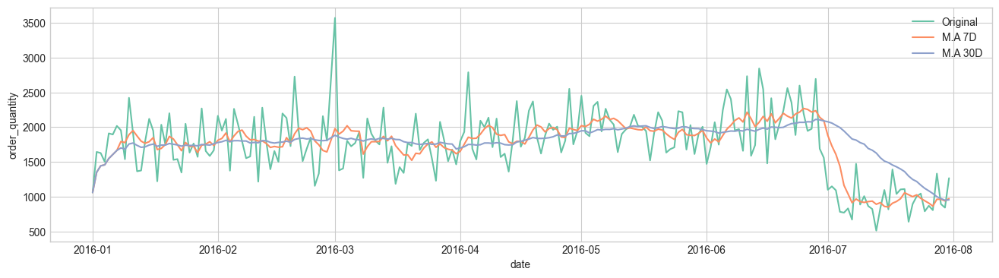

In [12]:
years = np.sort(df['year'].unique())

for year in years:
    df_year = df[df['year']==year]
    daily_sales_year = df_year[['date','order_quantity']].groupby('date').sum()
    daily_sales_year['moving_average_7d'] = daily_sales_year['order_quantity'].rolling(window="7D").mean()
    daily_sales_year['moving_average_30d'] = daily_sales_year['order_quantity'].rolling(window="30D").mean()
    plt.figure(figsize = (16,4))
    sns.lineplot(data = daily_sales_year, x = 'date', y='order_quantity', label = 'Original')
    sns.lineplot(data = daily_sales_year, x = 'date', y='moving_average_7d', label = 'M.A 7D')
    sns.lineplot(data = daily_sales_year, x = 'date', y='moving_average_30d', label = 'M.A 30D')
    plt.show()

### Sazonalidade

In [13]:
df['month'] = df['date'].dt.month

monthly = df.groupby(['year', 'month'])['order_quantity'].sum().reset_index()

final_stats = monthly.groupby('month')['order_quantity'].agg(['mean', 'sum']).reset_index()

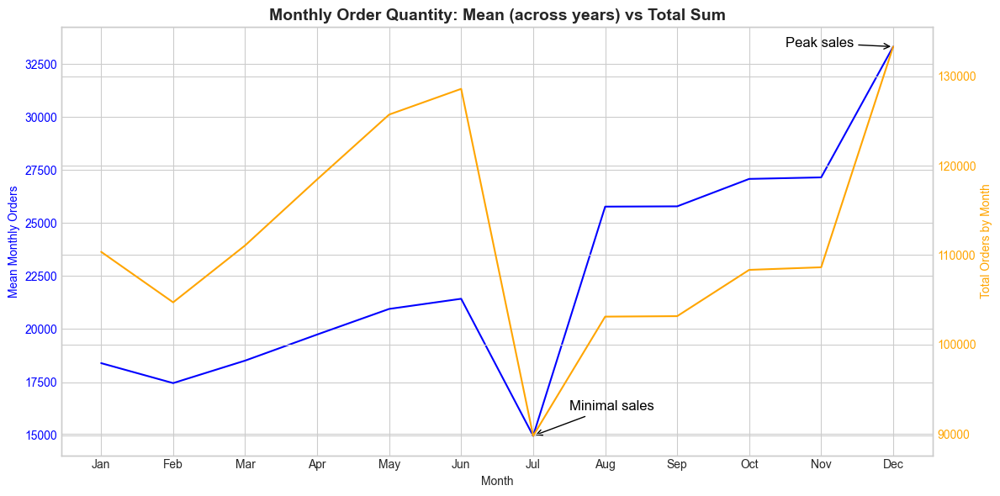

In [14]:
fig, ax1 = plt.subplots(figsize=(12, 6))

sns.lineplot(data=final_stats, x='month', y='mean', ax=ax1, color='blue')
ax1.set_ylabel('Mean Monthly Orders', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()
sns.lineplot(data=final_stats, x='month', y='sum', ax=ax2, color='orange')
ax2.set_ylabel('Total Orders by Month', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')

ax1.set_title('Monthly Order Quantity: Mean (across years) vs Total Sum', fontsize = 14, fontweight = 'bold')
ax1.set_xlabel('Month')
ax1.set_xticks(range(1, 13))
ax1.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                     'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])


ax1.annotate(
    'Minimal sales',
    xy=(7, final_stats.loc[final_stats['month'] == 7, 'mean'].values[0]),
    xytext=(7.5, final_stats['mean'].min() + 1200),
    arrowprops=dict(arrowstyle='->', color='black'),
    color='black',
    fontsize = 12
)

ax1.annotate(
    'Peak sales',
    xy=(12, final_stats.loc[final_stats['month'] == 12, 'mean'].values[0]),
    xytext=(10.5, final_stats['mean'].max() - 9),
    arrowprops=dict(arrowstyle='->', color='black'),
    color='black',
    fontsize = 12
)

fig.tight_layout()
plt.show()


C:\Users\giode\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128198 (\N{TEAR-OFF CALENDAR}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


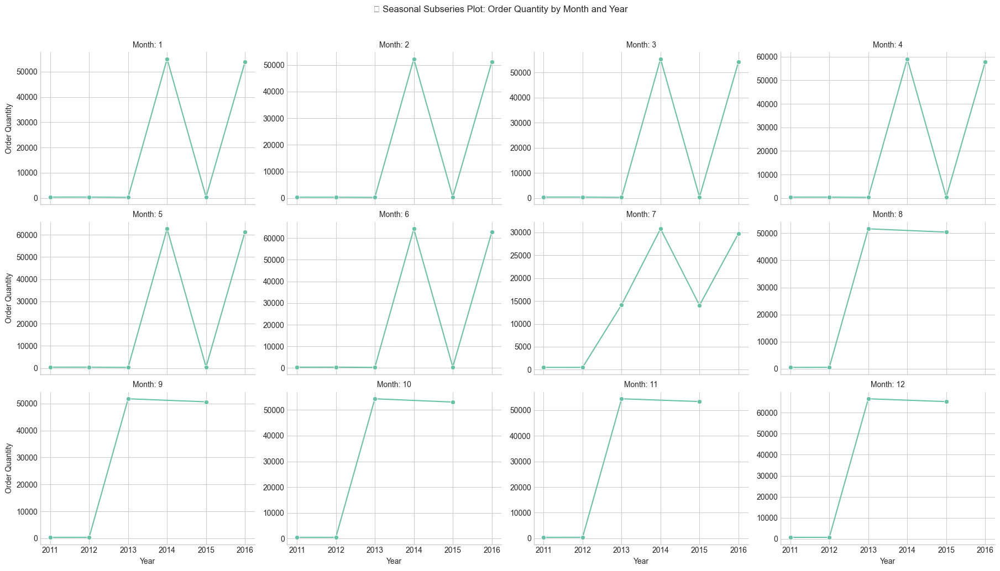

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a DataFrame with monthly sums by year
monthly_by_year = df.groupby(['year', 'month'])['order_quantity'].sum().reset_index()

# Set up the FacetGrid: 12 subplots (one for each month)
g = sns.FacetGrid(monthly_by_year, col='month', col_wrap=4, height=3.5, aspect=1.3, sharey=False)

# Lineplot of value across years per month
g.map(sns.lineplot, 'year', 'order_quantity', marker='o')

# Title and layout
g.set_titles('Month: {col_name}')
g.set_axis_labels('Year', 'Order Quantity')
plt.subplots_adjust(top=0.9)
g.fig.suptitle('📆 Seasonal Subseries Plot: Order Quantity by Month and Year')
plt.show()


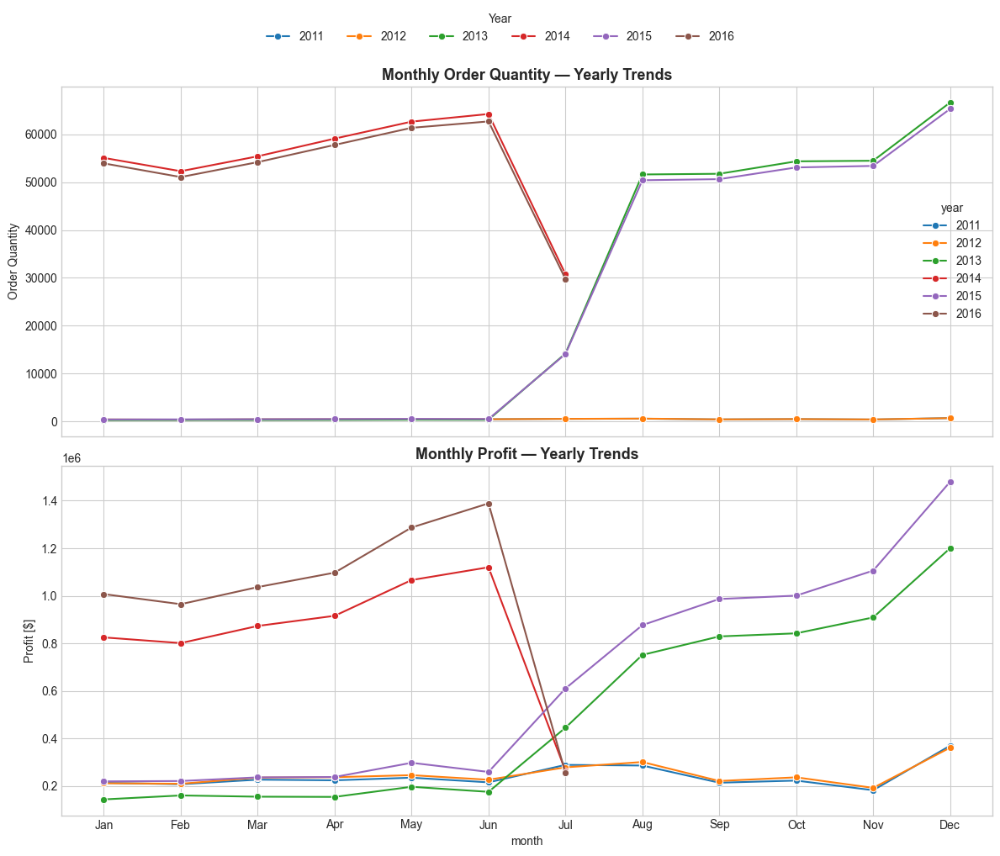

In [16]:
# Agrupar por ano e mês para somar pedidos e lucro
monthly_by_year = df.groupby(['year', 'month'])[['order_quantity', 'profit']].sum().reset_index()

# Criação da figura com 2 subplots (um para pedidos e outro para lucro)
fig, axs = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Gráfico 1: Quantidade de pedidos por mês
sns.lineplot(
    data=monthly_by_year,
    x='month', y='order_quantity', hue='year',
    palette='tab10', marker='o', ax=axs[0]
)
axs[0].set_title('Monthly Order Quantity — Yearly Trends', fontsize=13, fontweight='bold')
axs[0].set_ylabel('Order Quantity')
axs[0].grid(True)

# Gráfico 2: Lucro por mês
sns.lineplot(
    data=monthly_by_year,
    x='month', y='profit', hue='year',
    palette='tab10', marker='o', ax=axs[1],
    legend=False  # Já temos legenda acima
)
axs[1].set_title('Monthly Profit — Yearly Trends', fontsize=13, fontweight='bold')
axs[1].set_ylabel('Profit [$]')
axs[1].grid(True)

# Ajustar os rótulos do eixo X para nomes dos meses
axs[1].set_xticks(range(1, 13))
axs[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                        'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Legenda no topo
fig.legend(
    *axs[0].get_legend_handles_labels(),
    title='Year', loc='upper center', ncol=len(monthly_by_year['year'].unique()),
    bbox_to_anchor=(0.5, 1.02)
)

# Layout final
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.savefig("sales_over_year.png", dpi=300)
plt.show()


## Client profile

In [17]:
df['customer_age'].describe()

count    113036.000000
mean         35.919212
std          11.021936
min          17.000000
25%          28.000000
50%          35.000000
75%          43.000000
max          87.000000
Name: customer_age, dtype: float64

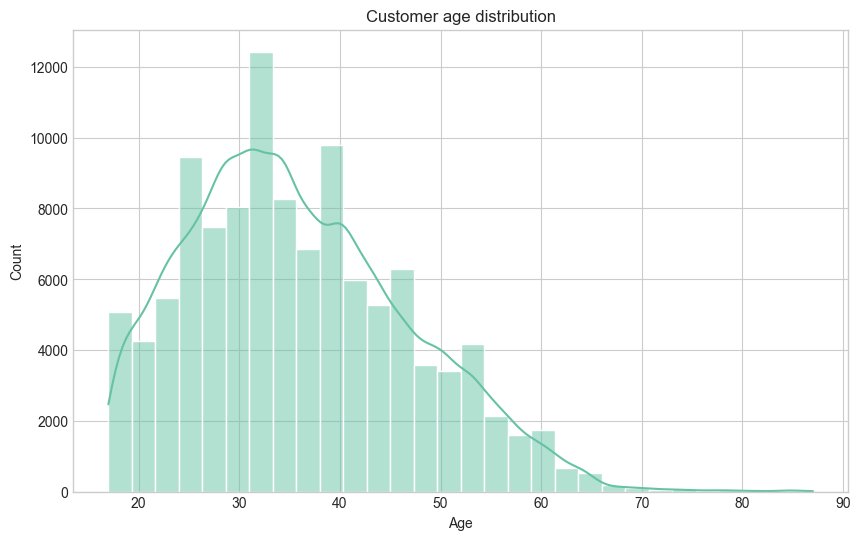

In [18]:
plt.figure(figsize=(10, 6))
sns.histplot(df['customer_age'], bins=30, kde=True)
plt.title('Customer age distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

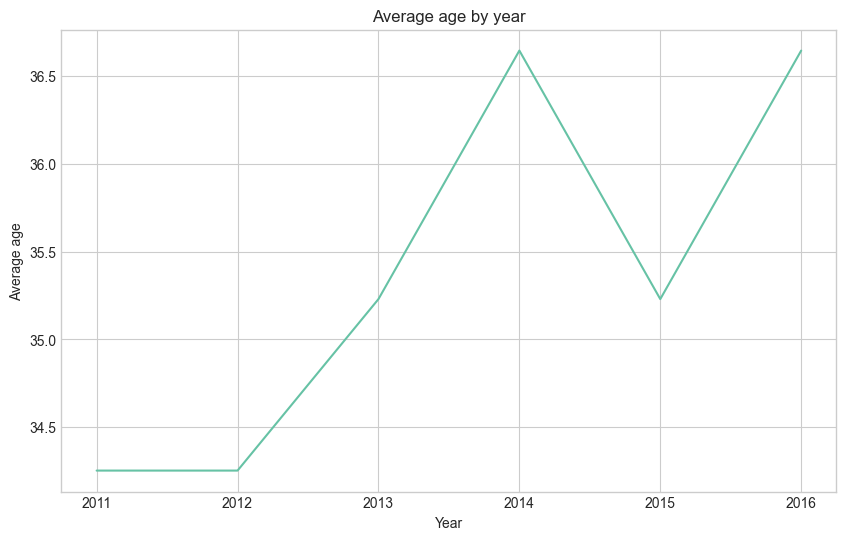

In [19]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df.groupby('year')['customer_age'].mean().reset_index(), x='year', y='customer_age')
plt.title('Average age by year')
plt.ylabel('Average age')
plt.xlabel('Year')
plt.show()

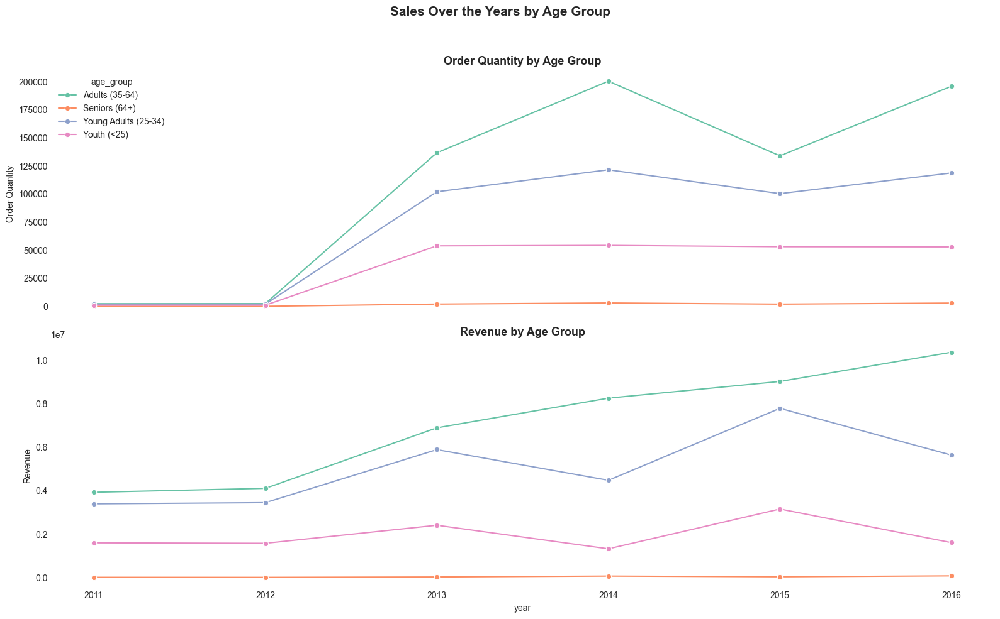

In [20]:
sales_year_age_qty = df.groupby(['year', 'age_group'])[['order_quantity']].sum().reset_index()
sales_year_age_rev = df.groupby(['year', 'age_group'])[['revenue']].sum().reset_index()

# Set up subplots
fig, axes = plt.subplots(2, 1, figsize=(16, 10), sharex=True)

# Order Quantity plot
sns.lineplot(
    data=sales_year_age_qty,
    x='year', y='order_quantity',
    hue='age_group', marker='o', ax=axes[0]
)
axes[0].set_title('Order Quantity by Age Group', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Order Quantity')
axes[0].grid(False)

# Revenue plot
sns.lineplot(
    data=sales_year_age_rev,
    x='year', y='revenue',
    hue='age_group', marker='o', ax=axes[1],
    legend=False  # hide duplicated legend
)
axes[1].set_title('Revenue by Age Group', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Revenue')
axes[1].grid(False)

# Remove plot borders (spines)
for ax in axes:
    for spine in ax.spines.values():
        spine.set_visible(False)

# Final layout
fig.suptitle('Sales Over the Years by Age Group', fontsize=15, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("age_group.png", dpi=300)
plt.show()

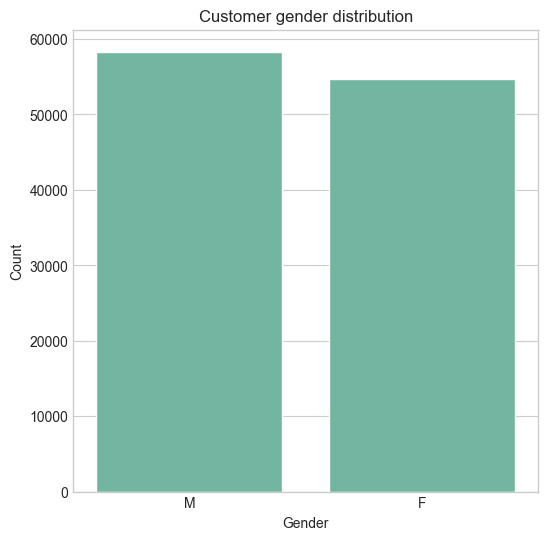

In [21]:
plt.figure(figsize=(6, 6))
sns.countplot(x='customer_gender', data=df)
plt.title('Customer gender distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

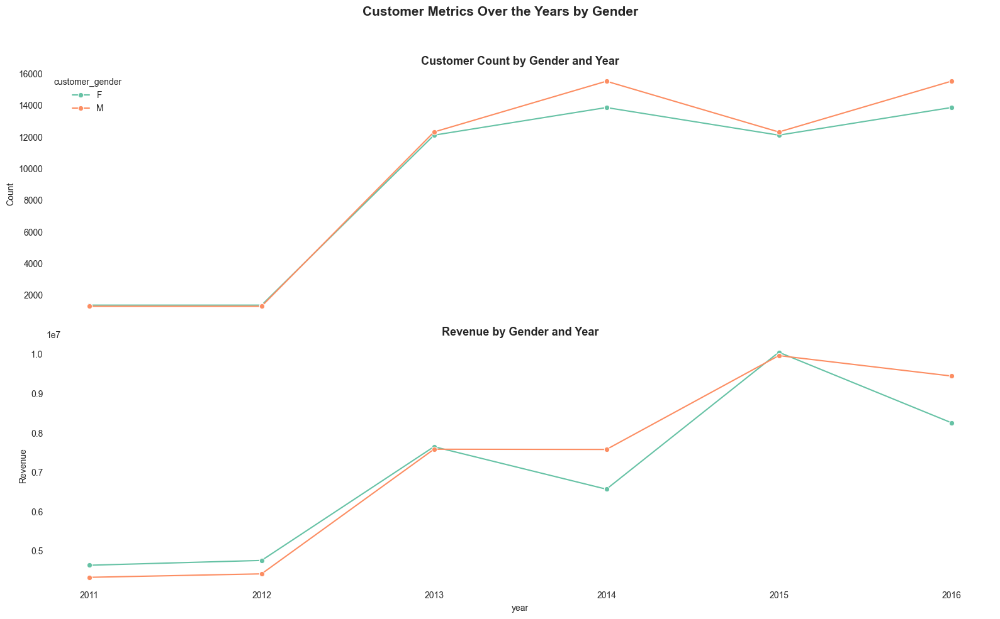

In [22]:
# Agrupar dados
gender_year_count = df.groupby(['year', 'customer_gender']).size().reset_index(name='count')
gender_year_revenue = df.groupby(['year', 'customer_gender'])[['revenue']].sum().reset_index()

# Criar subplots lado a lado
fig, axes = plt.subplots(2, 1, figsize=(16, 10), sharex=True)

# Gráfico de contagem
sns.lineplot(
    data=gender_year_count,
    x='year', y='count',
    hue='customer_gender', marker='o', ax=axes[0]
)
axes[0].set_title('Customer Count by Gender and Year', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Count')
axes[0].grid(False)

# Gráfico de receita
sns.lineplot(
    data=gender_year_revenue,
    x='year', y='revenue',
    hue='customer_gender', marker='o', ax=axes[1],
    legend=False  # remove legenda duplicada
)
axes[1].set_title('Revenue by Gender and Year', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Revenue')
axes[1].grid(False)

# Remover as bordas dos gráficos
for ax in axes:
    for spine in ax.spines.values():
        spine.set_visible(False)

# Ajustes finais
fig.suptitle('Customer Metrics Over the Years by Gender', fontsize=15, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## Sales over countries

In [23]:
df.groupby('country')[['revenue']].sum().sort_values(by = 'revenue', ascending = False)

,revenue
country,
United States,27975547
Australia,21302059
United Kingdom,10646196
Germany,8978596
France,8432872
Canada,7935738


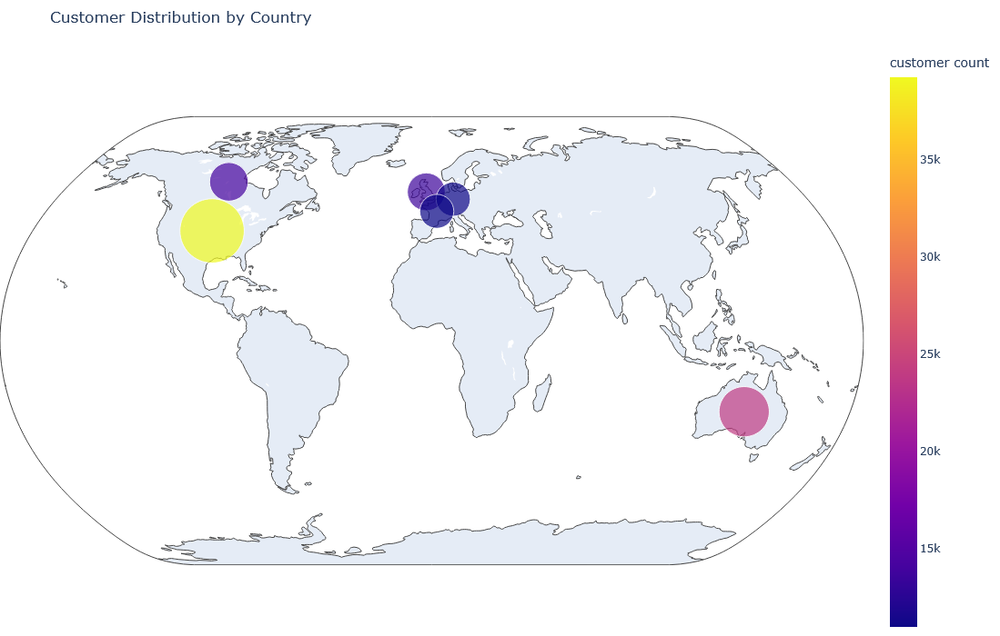

In [24]:

# Grouping customers per country
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['country', 'customer count']

# Get ISO alpha-3 codes
def get_iso3(country_name):
    try:
        return pycountry.countries.lookup(country_name).alpha_3
    except:
        return None

country_counts['iso_alpha'] = country_counts['country'].apply(get_iso3)

# Drop missing ISO codes (if any)
country_counts = country_counts.dropna(subset=['iso_alpha'])

# Bubble map
fig = px.scatter_geo(country_counts,
                     locations="iso_alpha",
                     hover_name="country",
                     size="customer count",
                     color="customer count",
                     projection="natural earth",
                     title="Customer Distribution by Country",
                     color_continuous_scale="Plasma",
                     size_max=50)

# Update layout for a bigger image
fig.update_layout(
    height=700,
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()


In [25]:
sales_year_country_revenue = df.groupby(['country','year'])[['revenue']].sum().sort_values(by = 'revenue', ascending = False).reset_index()
sales_year_country_orders = df.groupby(['country','year'])[['order_quantity']].sum().sort_values(by = 'order_quantity', ascending = False).reset_index()


C:\Users\giode\anaconda3\lib\site-packages\seaborn\distributions.py:413: UserWarning:

`bins` cannot be 'auto' when using weights. Setting `bins=10`, but you will likely want to adjust.

C:\Users\giode\anaconda3\lib\site-packages\seaborn\distributions.py:413: UserWarning:

`bins` cannot be 'auto' when using weights. Setting `bins=10`, but you will likely want to adjust.



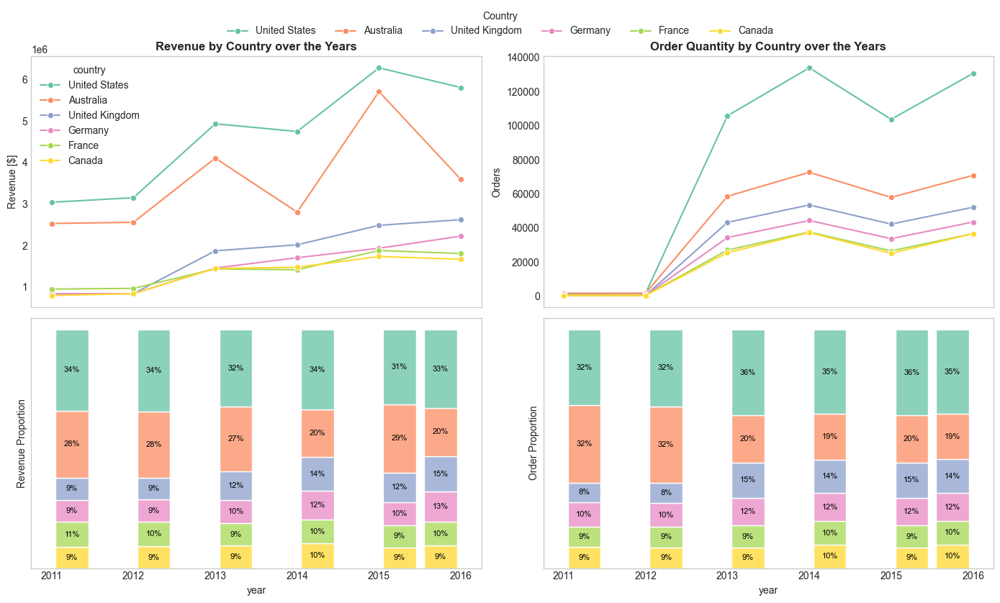

In [26]:
# 3. Calcular o total de receita por ano para calcular as proporções
total_revenue_by_year = df.groupby('year')['revenue'].sum().reset_index(name='total_revenue')

# 4. Calcular a proporção de receita por país e ano
sales_year_country_revenue = sales_year_country_revenue.merge(total_revenue_by_year, on='year')
sales_year_country_revenue['proportion_revenue'] = sales_year_country_revenue['revenue'] / sales_year_country_revenue['total_revenue']

# 5. Calcular o total de quantidade de pedidos por ano para calcular as proporções
total_orders_by_year = df.groupby('year')['order_quantity'].sum().reset_index(name='total_orders')

# 6. Calcular a proporção de quantidade de pedidos por país e ano
sales_year_country_orders = sales_year_country_orders.merge(total_orders_by_year, on='year')
sales_year_country_orders['proportion_orders'] = sales_year_country_orders['order_quantity'] / sales_year_country_orders['total_orders']

# 7. Calcular a proporção de vendas de cada país para o histograma empilhado
sales_prop_revenue = sales_year_country_revenue[['year', 'country', 'proportion_revenue']]
sales_prop_orders = sales_year_country_orders[['year', 'country', 'proportion_orders']]

# --- Criação do Gráfico ---

# Subplots: 2 linhas, 2 colunas
fig, axs = plt.subplots(2, 2, figsize=(14, 8), sharex='col')

# --- Gráfico de Linha: Receita por País ao Longo dos Anos ---
sns.lineplot(
    data=sales_year_country_revenue,
    x='year', y='revenue',
    hue='country', marker='o', ax=axs[0, 0]
)
axs[0, 0].set_title('Revenue by Country over the Years', fontsize=12, fontweight='bold')
axs[0, 0].set_ylabel('Revenue [$]')
axs[0, 0].grid(False)

# --- Gráfico de Linha: Quantidade de Pedidos por País ao Longo dos Anos ---
sns.lineplot(
    data=sales_year_country_orders,
    x='year', y='order_quantity',
    hue='country', marker='o', ax=axs[0, 1],
    legend=False
)
axs[0, 1].set_title('Order Quantity by Country over the Years', fontsize=12, fontweight='bold')
axs[0, 1].set_ylabel('Orders')
axs[0, 1].grid(False)

# --- Histograma Empilhado: Proporção de Receita por País ---
sns.histplot(
    data=sales_prop_revenue,
    x='year', weights='proportion_revenue',
    hue='country', multiple='stack',
    shrink=0.8, ax=axs[1, 0], legend=False
)
axs[1, 0].set_ylabel('Revenue Proportion')
axs[1, 0].grid(False)
axs[1, 0].set_yticks([])

# --- Histograma Empilhado: Proporção de Quantidade de Pedidos por País ---
sns.histplot(
    data=sales_prop_orders,
    x='year', weights='proportion_orders',
    hue='country', multiple='stack',
    shrink=0.8, ax=axs[1, 1], legend=False
)
axs[1, 1].set_ylabel('Order Proportion')
axs[1, 1].grid(False)
axs[1, 1].set_yticks([])

# --- Anotação das Proporções nos Histogramas ---
for ax in [axs[1, 0], axs[1, 1]]:
    for container in ax.containers:
        for bar in container:
            height = bar.get_height()
            if height > 0:
                ax.annotate(
                    f'{height:.0%}',
                    xy=(bar.get_x() + bar.get_width() / 2, bar.get_y() + height / 2),
                    ha='center', va='center',
                    fontsize=8, color='black'
                )

# --- Legenda Centralizada no Topo ---
fig.legend(
    *axs[0, 0].get_legend_handles_labels(),
    title='Country', loc='upper center', ncol=len(sales_year_country_revenue['country'].unique()),
    bbox_to_anchor=(0.5, 1.05)
)

# Ajustando o layout para melhor visualização
plt.tight_layout()
plt.show()

In [27]:
df_country_categories = df.groupby(['country', 'product_category','year'])[['profit','order_quantity']].sum().reset_index()

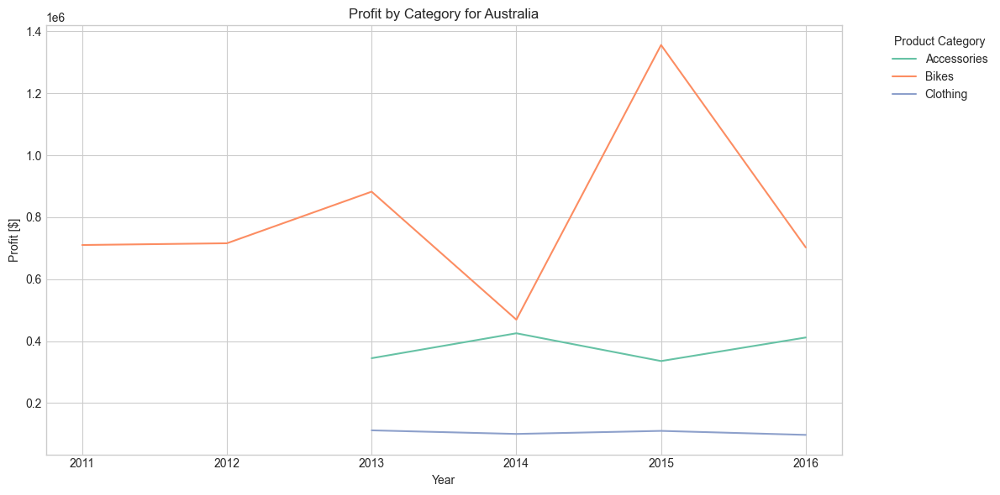

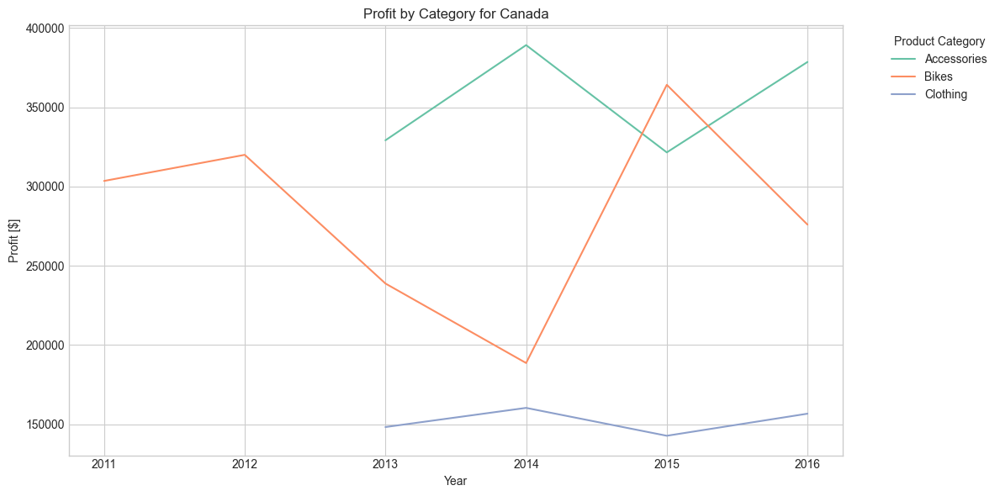

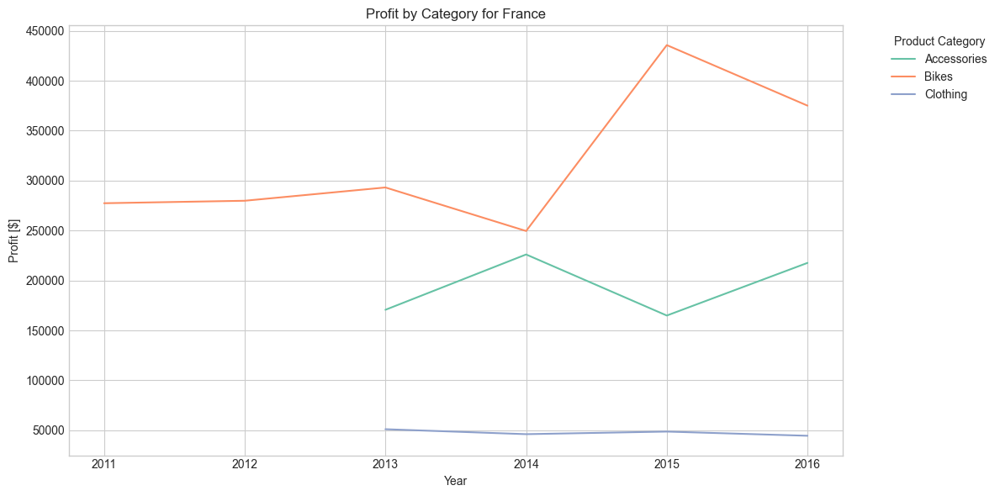

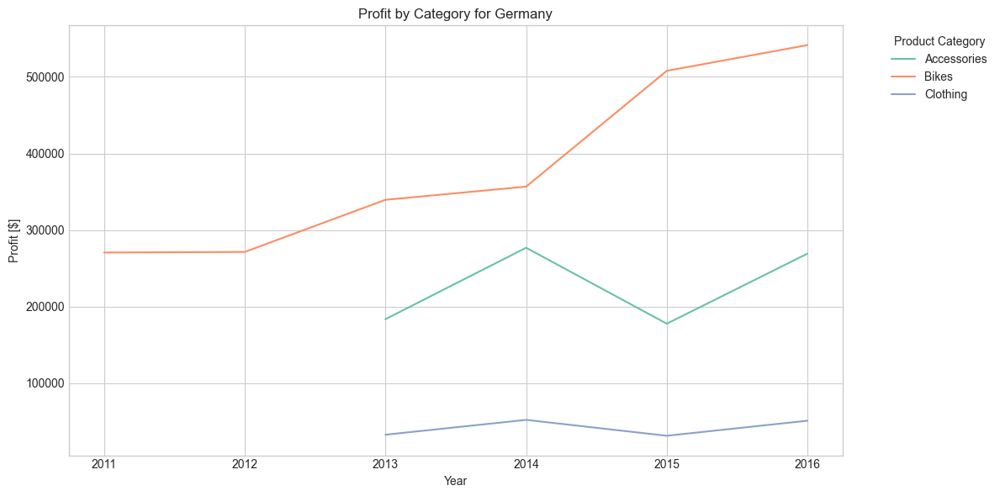

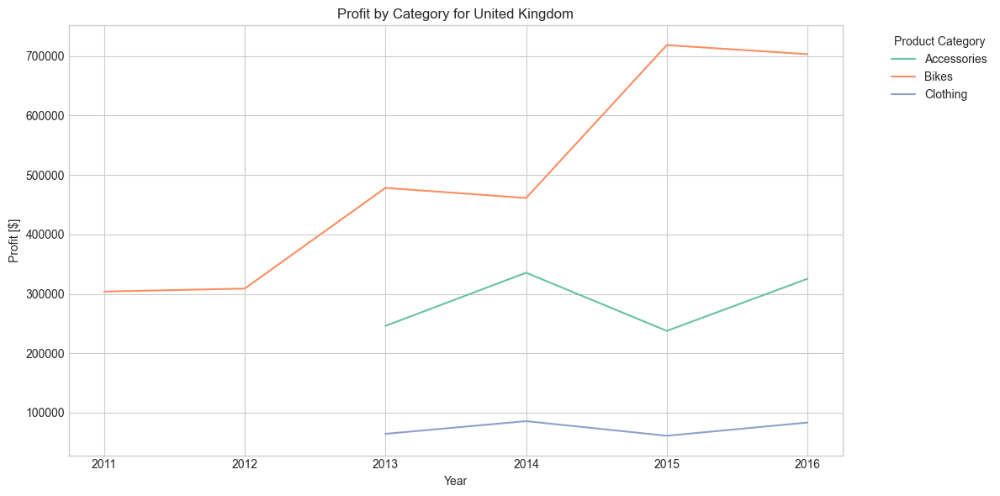

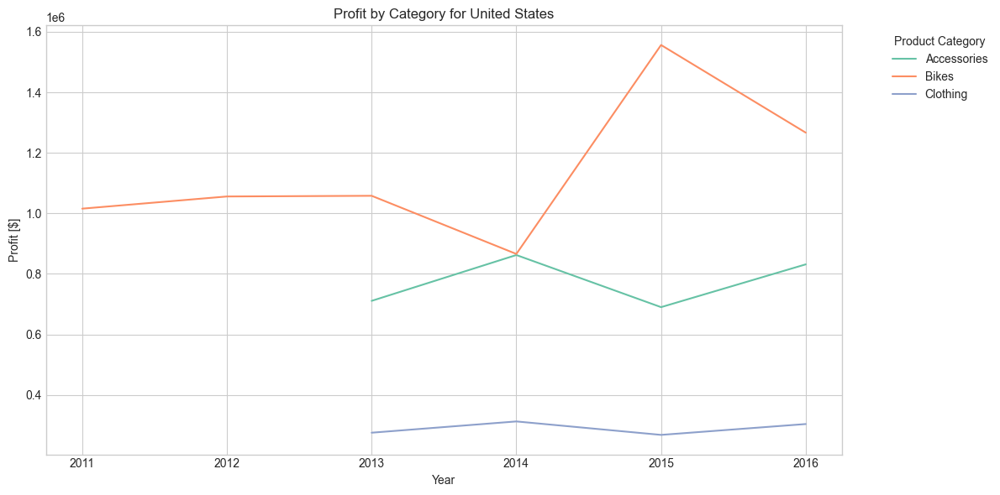

In [28]:
# Get the unique countries
countries = df_country_categories['country'].unique()

# Create a plot for each country
for country in countries:
    # Filter data for the current country
    df_country = df_country_categories[df_country_categories['country'] == country]
    
    # Create the plot
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_country, x='year', y='profit', hue='product_category', markers=True)

    # Add labels and title
    plt.title(f'Profit by Category for {country}')
    plt.xlabel('Year')
    plt.ylabel('Profit [$]')
    plt.legend(title='Product Category', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Show the plot
    plt.tight_layout()
    plt.show()

## Product Sales

In [29]:
print(f"Number of products: {df['product'].nunique()}")
print(f"Number of categories: {df['product_category'].nunique()}")
print(f"Number of subcategories: {df['sub_category'].nunique()}")

Number of products: 130
Number of categories: 3
Number of subcategories: 17


In [30]:
df.groupby(['product_category', 'sub_category'])[['product']].nunique()

product
product_category sub_category              
Accessories      Bike Racks               1
                 Bike Stands              2
                 Bottles and Cages        3
                 Cleaners                 2
                 Fenders                  2
                 Helmets                  3
                 Hydration Packs          2
                 Tires and Tubes         11
Bikes            Mountain Bikes          28
                 Road Bikes              38
                 Touring Bikes           22
Clothing         Caps                     2
                 Gloves                   4
                 Jerseys                  8
                 Shorts                   3
                 Socks                    3
                 Vests                    4

In [31]:
(
    df.groupby(['product_category', 'sub_category'])[['order_quantity']]
    .sum()
    .reset_index()
    .sort_values("order_quantity", ascending = False)

) 

,product_category,sub_category,order_quantity
7,Accessories,Tires and Tubes,514051
2,Accessories,Bottles and Cages,241726
5,Accessories,Helmets,181606
13,Clothing,Jerseys,88125
11,Clothing,Caps,67268
4,Accessories,Fenders,62138
12,Clothing,Gloves,39978
3,Accessories,Cleaners,27574
14,Clothing,Shorts,27168
6,Accessories,Hydration Packs,19914


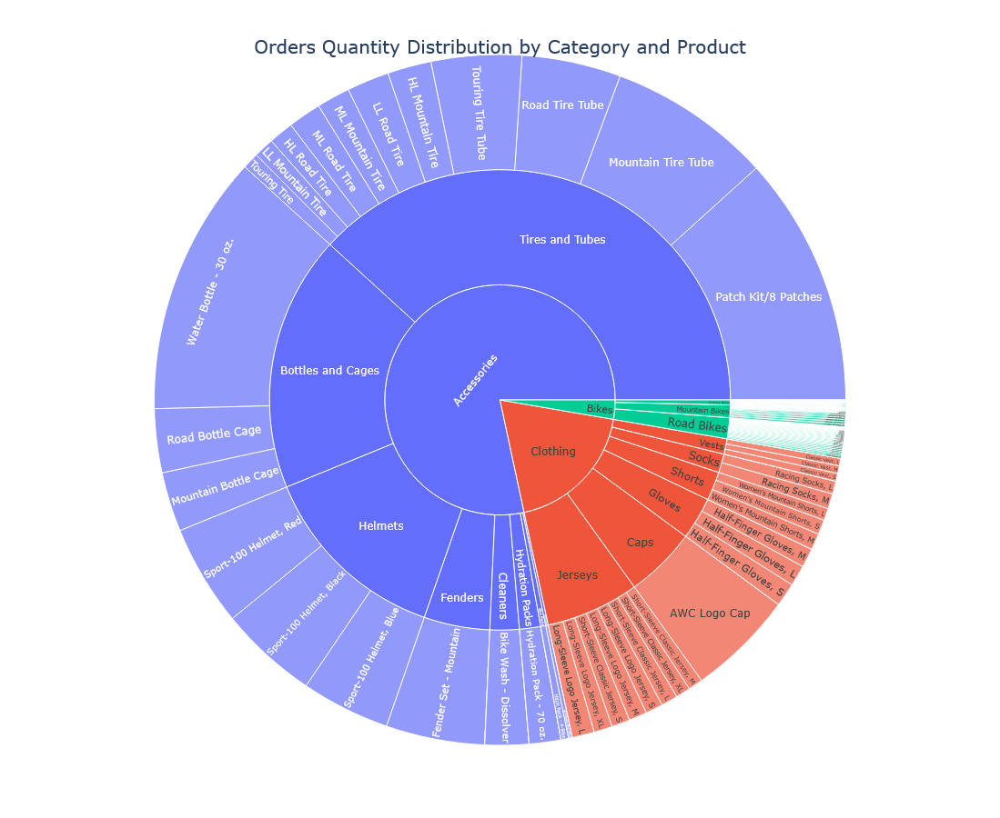

In [32]:
fig = px.sunburst(
    df,
    path=['product_category', 'sub_category', 'product'],
    values='order_quantity'
)

fig.update_layout(
    width=900,
    height=900,
    title={
        'text': 'Orders Quantity Distribution by Category and Product',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20)
    }
)
fig.write_image("orders_quantity.png")
fig.show()


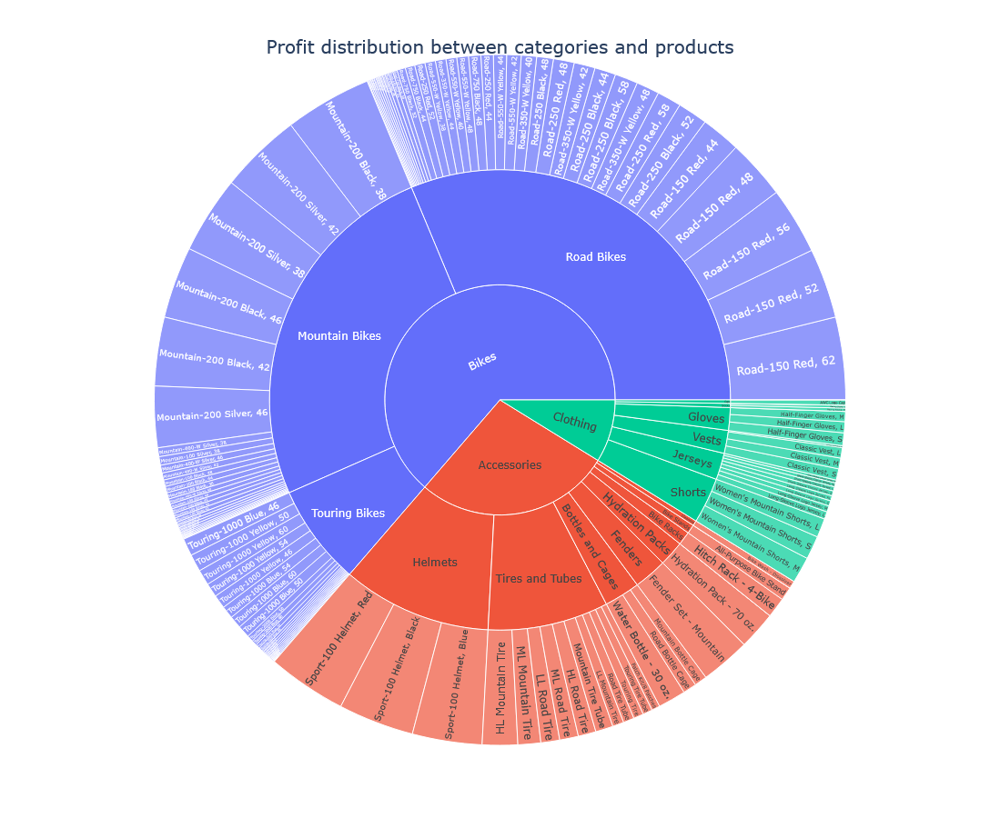

In [33]:
fig = px.sunburst(
    df,
    path=['product_category', 'sub_category', 'product'],
    values='profit'
)

fig.update_layout(
    width=900,
    height=900,
    title={
        'text': 'Profit distribution between categories and products',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20)
    }
)
fig.write_image("sunburst_profit.png")
fig.show()

In [34]:
pareto_profit = df.groupby('product')[['profit']].sum().sort_values(by = 'profit', ascending = False)
pareto_profit['percentage'] = pareto_profit['profit']/pareto_profit['profit'].sum()
pareto_profit['cummulative'] = pareto_profit['percentage'].cumsum()

profit_main = pareto_profit[pareto_profit['cummulative'] <= 0.8].copy()
profit_other = pareto_profit[pareto_profit['cummulative'] > 0.8]
profit_other_row = pd.DataFrame({
    'revenue': [profit_other['profit'].sum()],
    'percentage': [profit_other['percentage'].sum()],
    'cummulative': [1.0]
}, index=['Other products'])

pareto_profit_grouped = pd.concat([profit_main, profit_other_row])

pareto_order = df.groupby('product')[['order_quantity']].sum().sort_values(by = 'order_quantity', ascending = False)
pareto_order['percentage'] = pareto_order['order_quantity']/pareto_order['order_quantity'].sum()
pareto_order['cummulative'] = pareto_order['percentage'].cumsum()

order_main = pareto_order[pareto_order['cummulative'] <= 0.8].copy()
order_other = pareto_order[pareto_order['cummulative'] > 0.8]
order_other_row = pd.DataFrame({
    'order_quantity': [order_other['order_quantity'].sum()],
    'percentage': [order_other['percentage'].sum()],
    'cummulative': [1.0]
}, index=['Other products'])

pareto_order_grouped = pd.concat([order_main, order_other_row])

pareto_profit_grouped = pareto_profit_grouped.reset_index().rename(columns ={'index':'product'})
pareto_order_grouped = pareto_order_grouped.reset_index().rename(columns ={'index':'product'})

In [35]:
pareto_order_grouped

,product,order_quantity,percentage,cummulative
0,Water Bottle - 30 oz.,164086,0.121968,0.121968
1,Patch Kit/8 Patches,157583,0.117135,0.239103
2,Mountain Tire Tube,102792,0.076407,0.315510
3,AWC Logo Cap,67316,0.050037,0.365548
4,"Sport-100 Helmet, Red",63663,0.047322,0.412870
5,Road Tire Tube,62296,0.046306,0.459175
6,Fender Set - Mountain,62118,0.046174,0.505349
7,"Sport-100 Helmet, Black",62105,0.046164,0.551513
8,Touring Tire Tube,56802,0.042222,0.593735
9,"Sport-100 Helmet, Blue",55895,0.041548,0.635283


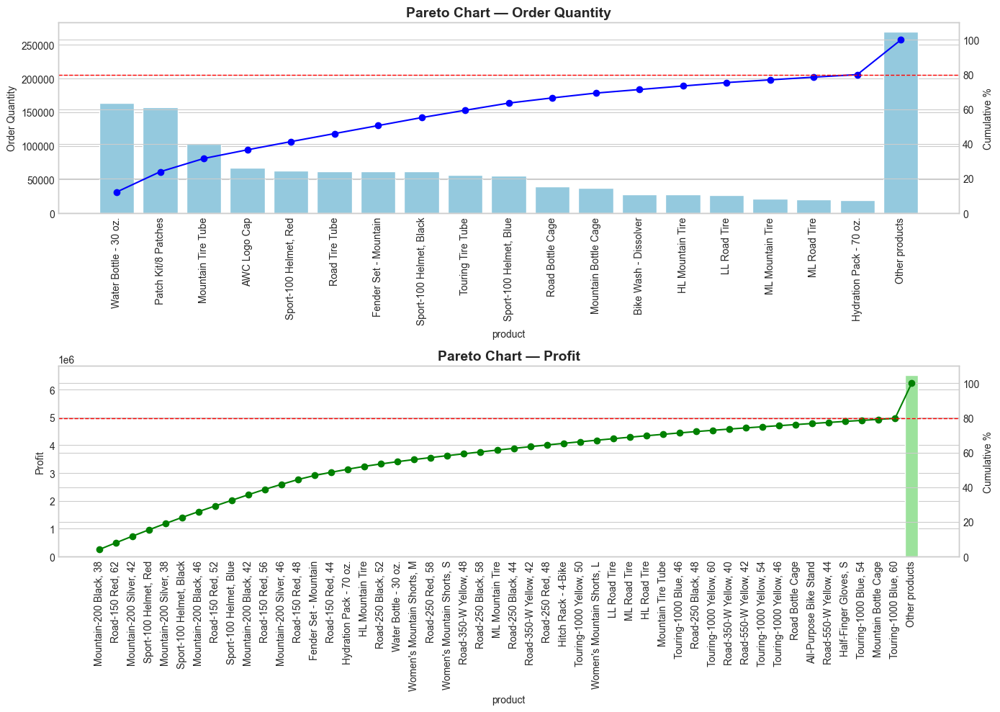

In [36]:
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Order Quantity Chart
sns.barplot(x='product', y='order_quantity', data=pareto_order_grouped, ax=axes[0], color='skyblue')
axes[0].set_title('Pareto Chart — Order Quantity', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Order Quantity')
axes[0].tick_params(axis='x', rotation=90)

# Twin axis for cumulative percentage
ax2 = axes[0].twinx()
ax2.plot(
    pareto_order_grouped['product'],
    pareto_order_grouped['cummulative'] * 100,
    color='blue', marker='o', label='Cumulative %'
)
ax2.axhline(80, color='red', linestyle='--', linewidth=1)
ax2.set_ylabel('Cumulative %')
ax2.set_ylim(0, 110)

# Revenue Chart
sns.barplot(x='product', y='revenue', data=pareto_profit_grouped, ax=axes[1], color='lightgreen')
axes[1].set_title('Pareto Chart — Profit', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Profit')
axes[1].tick_params(axis='x', rotation=90)

# Twin axis for cumulative percentage
ax4 = axes[1].twinx()
ax4.plot(
    pareto_profit_grouped['product'],
    pareto_profit_grouped['cummulative'] * 100,
    color='green', marker='o', label='Cumulative %'
)
ax4.axhline(80, color='red', linestyle='--', linewidth=1)
ax4.set_ylabel('Cumulative %')
ax4.set_ylim(0, 110)

plt.tight_layout()
plt.show()


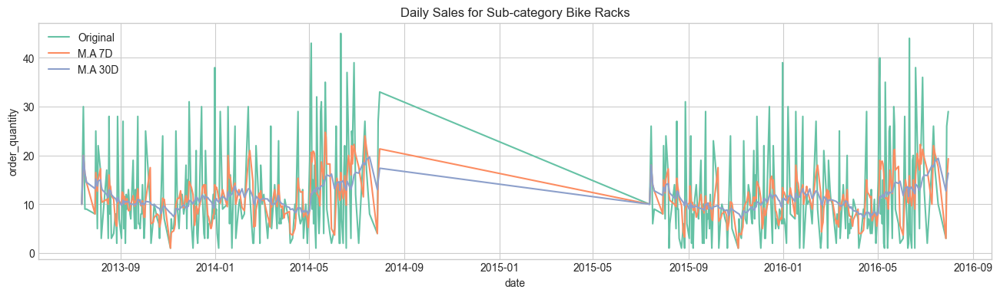

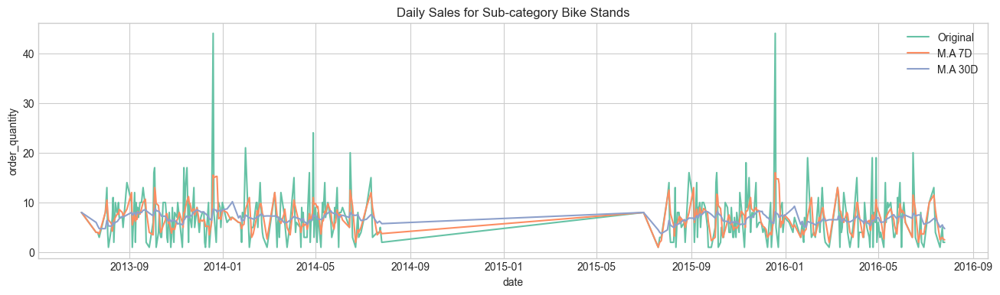

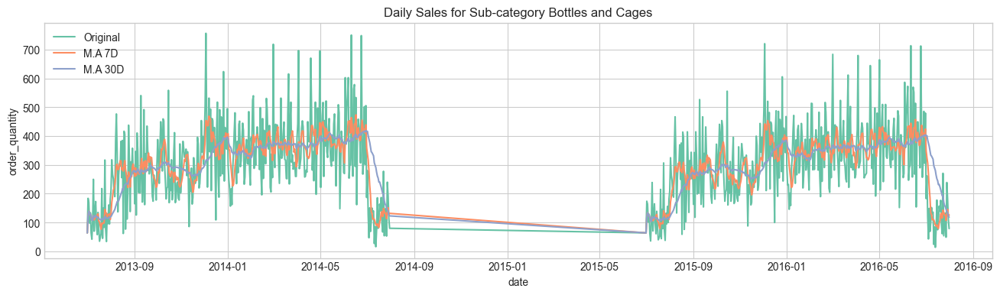

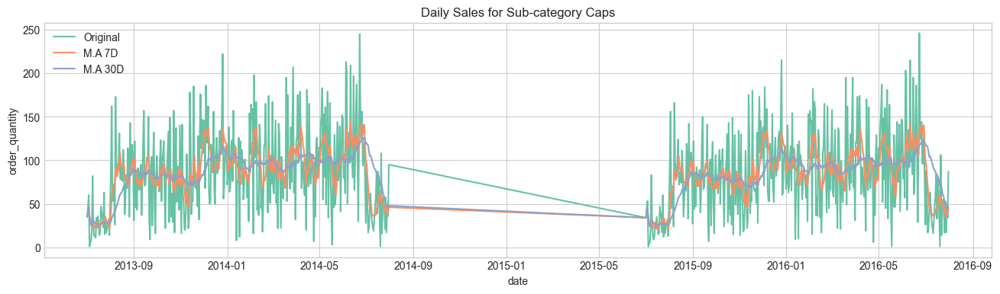

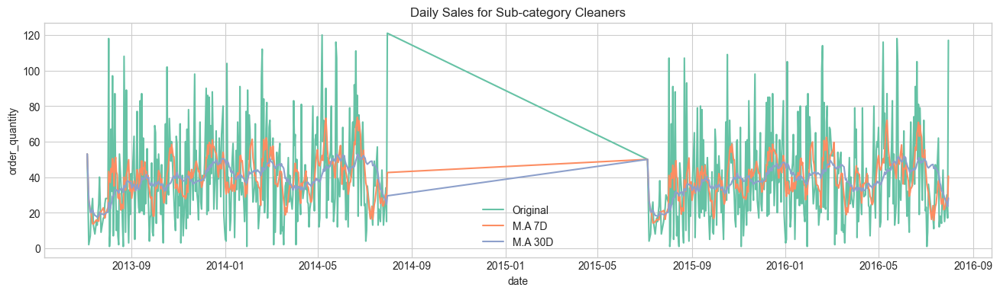

...

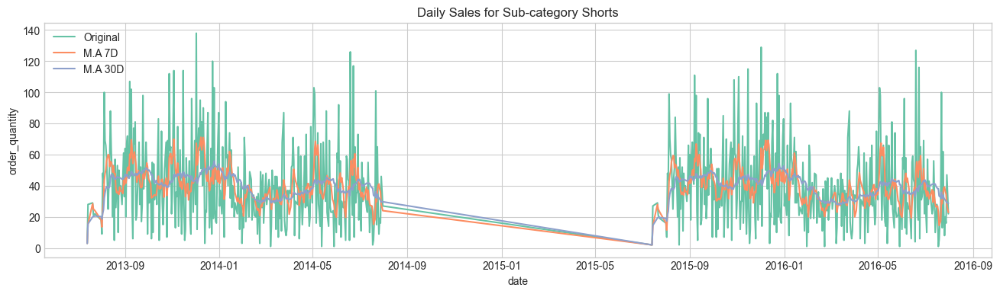

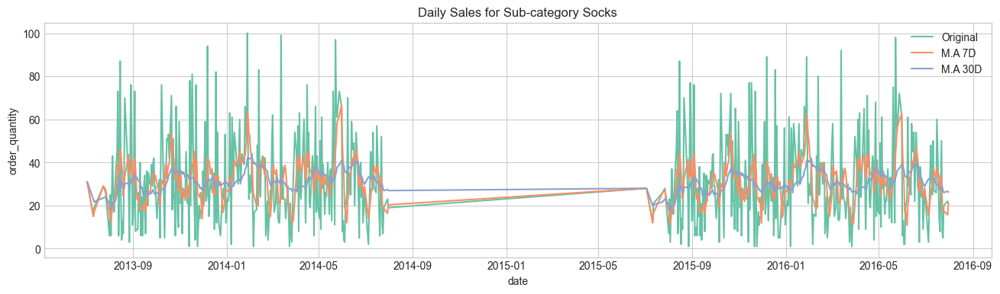

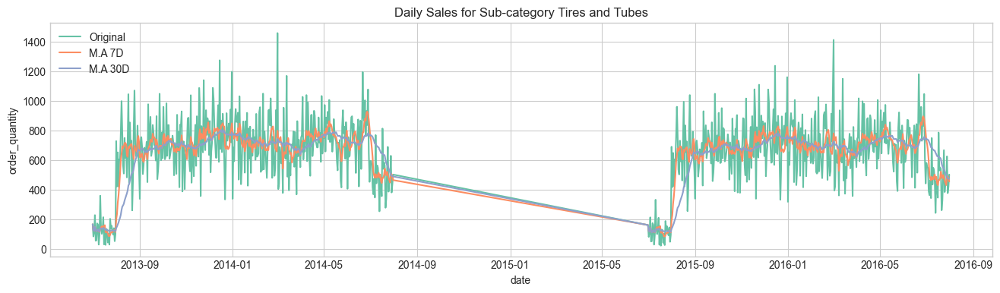

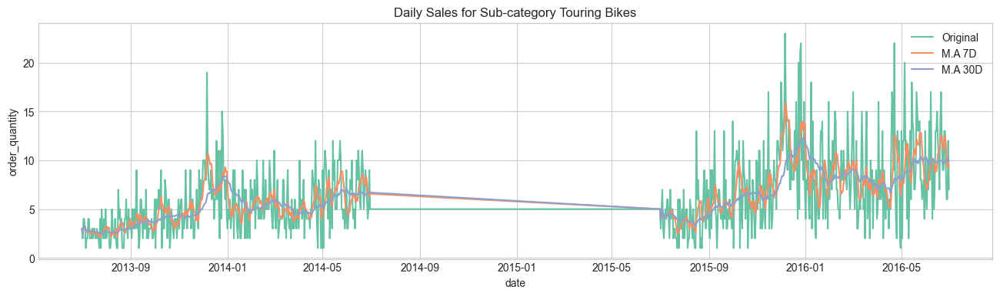

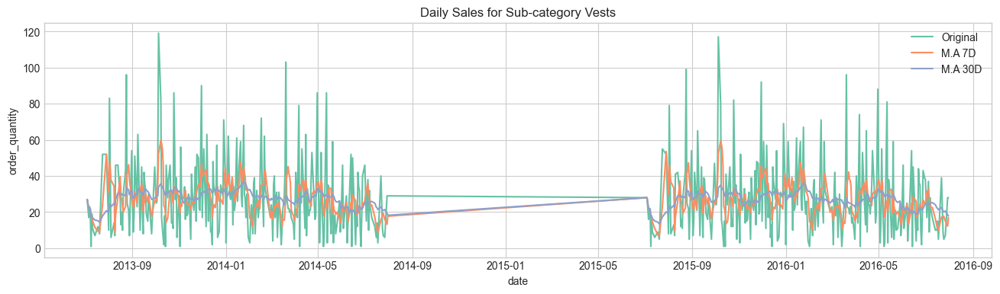

In [37]:
sub_cat = np.sort(df['sub_category'].unique())

for cat in sub_cat:
    df_cat = df[df['sub_category']==cat]
    df_cat_grouped = df_cat[['date','order_quantity']].groupby('date').sum()
    df_cat_grouped['moving_average_7d'] = df_cat_grouped['order_quantity'].rolling(window="7D").mean()
    df_cat_grouped['moving_average_30d'] = df_cat_grouped['order_quantity'].rolling(window="30D").mean()
    plt.figure(figsize = (16,4))
    sns.lineplot(data = df_cat_grouped, x = 'date', y='order_quantity', label = 'Original')
    sns.lineplot(data = df_cat_grouped, x = 'date', y='moving_average_7d', label = 'M.A 7D')
    sns.lineplot(data = df_cat_grouped, x = 'date', y='moving_average_30d', label = 'M.A 30D')
    plt.title(f"Daily Sales for Sub-category {cat}")
    plt.show()

## Profit Margin

In [38]:
df['margin'] = df['profit']/df['revenue']

In [39]:
df.margin.describe()

count    113036.000000
mean          0.472518
std           0.163577
min          -0.037037
25%           0.357143
50%           0.526316
75%           0.596774
max           0.750000
Name: margin, dtype: float64

In [40]:
print(f"Number of negative profit sales: {len(df[df['margin']<0])} of {len(df)}")

Number of negative profit sales: 58 of 113036


In [41]:
df[df['margin']<0].head()

,date,day,month,year,customer_age,age_group,customer_gender,country,state,product_category,sub_category,product,order_quantity,unit_cost,unit_price,profit,cost,revenue,margin
17098,2013-12-09,9,12,2013,20,Youth (<25),M,France,Yveline,Clothing,Caps,AWC Logo Cap,21,7,9,-3,147,144,-0.020833
17099,2015-12-09,9,12,2015,20,Youth (<25),M,France,Yveline,Clothing,Caps,AWC Logo Cap,23,7,9,-4,161,157,-0.025478
17484,2013-10-23,23,10,2013,34,Young Adults (25-34),M,France,Yveline,Clothing,Caps,AWC Logo Cap,28,7,9,-4,196,192,-0.020833
17485,2015-10-23,23,10,2015,34,Young Adults (25-34),M,France,Yveline,Clothing,Caps,AWC Logo Cap,29,7,9,-5,203,198,-0.025253
17486,2014-03-23,23,3,2014,34,Young Adults (25-34),M,France,Yveline,Clothing,Caps,AWC Logo Cap,4,7,9,-1,28,27,-0.037037


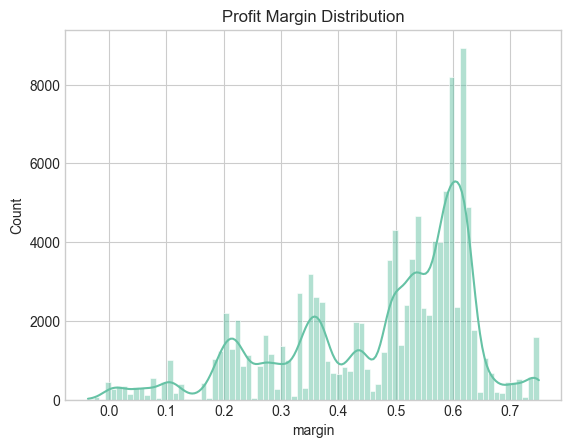

In [42]:
sns.histplot(data = df, x = 'margin', kde = True)
plt.title('Profit Margin Distribution');

In [43]:
total_margin = df['profit'].sum()/df['revenue'].sum()
print(f"Total Profit Margin: {total_margin*100:.2f}%")

Total Profit Margin: 37.79%


In [44]:
year_margin = {}
for year in years:
    df_year = df[df['year']==year]
    year_margin[year] = df_year.profit.sum()/df_year.revenue.sum()
    print(f"Profit margin for {year}: {year_margin[year]*100:.2f}")

Profit margin for 2011: 32.14
Profit margin for 2012: 32.17
Profit margin for 2013: 39.10
Profit margin for 2014: 41.43
Profit margin for 2015: 37.60
Profit margin for 2016: 39.72


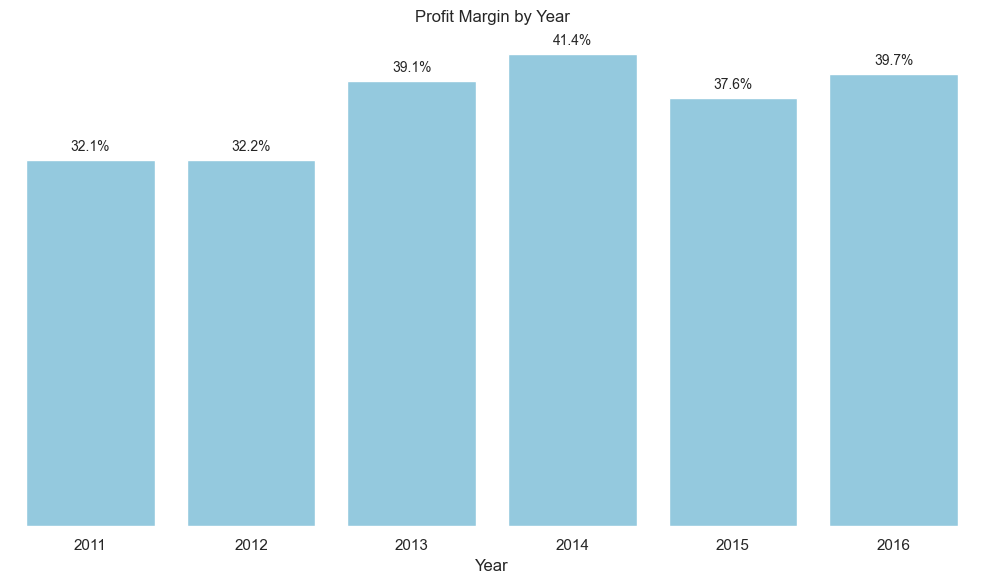

In [45]:
margin_df = pd.DataFrame({
    'year': list(year_margin.keys()),
    'profit_margin': [v * 100 for v in year_margin.values()]  # Convert to percentage
})

margin_df = margin_df.sort_values('year')

# Plot
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(data=margin_df, x='year', y='profit_margin', color='skyblue')

plt.ylabel("")
plt.yticks([])
plt.xlabel("Year")
plt.title("Profit Margin by Year")
plt.box(False)

for i, row in margin_df.iterrows():
    plt.text(i, row['profit_margin'] + 0.5, f"{row['profit_margin']:.1f}%", 
             ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

### Profit Margin for Product category

In [46]:
margin_subcat = {}
for subcat in df.sub_category.unique():
    df_subcat = df[df['sub_category'] == subcat]
    margin_subcat[subcat] = df_subcat.profit.sum()/df_subcat.revenue.sum()

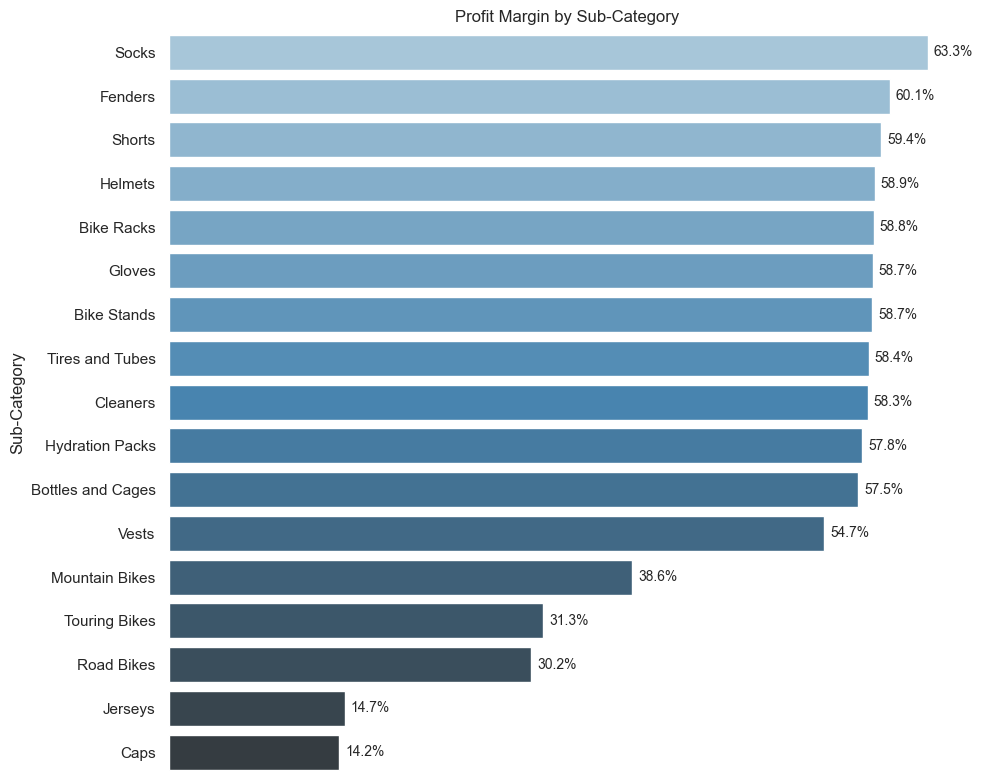

In [47]:
# Create sorted DataFrame
margin_df = pd.DataFrame(list(margin_subcat.items()), columns=['sub_category', 'margin'])
margin_df['margin_pct'] = margin_df['margin'] * 100
margin_df = margin_df.sort_values('margin', ascending=False)

plt.figure(figsize=(10, 8))

ax = sns.barplot(
    data=margin_df,
    x='margin_pct',
    y='sub_category',
    hue = 'sub_category',
    legend = False,
    order=margin_df['sub_category'],
    palette='Blues_d'
)

for bar in ax.patches:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2
    ax.text(width + 0.5, y, f"{width:.1f}%", va='center', ha='left', fontsize=10)

# Hide x-axis
ax.set_xlabel("")
ax.set_xticks([])
plt.title("Profit Margin by Sub-Category")
plt.ylabel("Sub-Category")
plt.tight_layout()
plt.box(False)
plt.show()

In [48]:
margin_cat = {}
for cat in df.product_category.unique():
    df_cat = df[df['product_category'] == cat]
    margin_cat[cat] = df_cat.profit.sum()/df_cat.revenue.sum()

C:\Users\giode\AppData\Local\Temp\ipykernel_11032\416899533.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




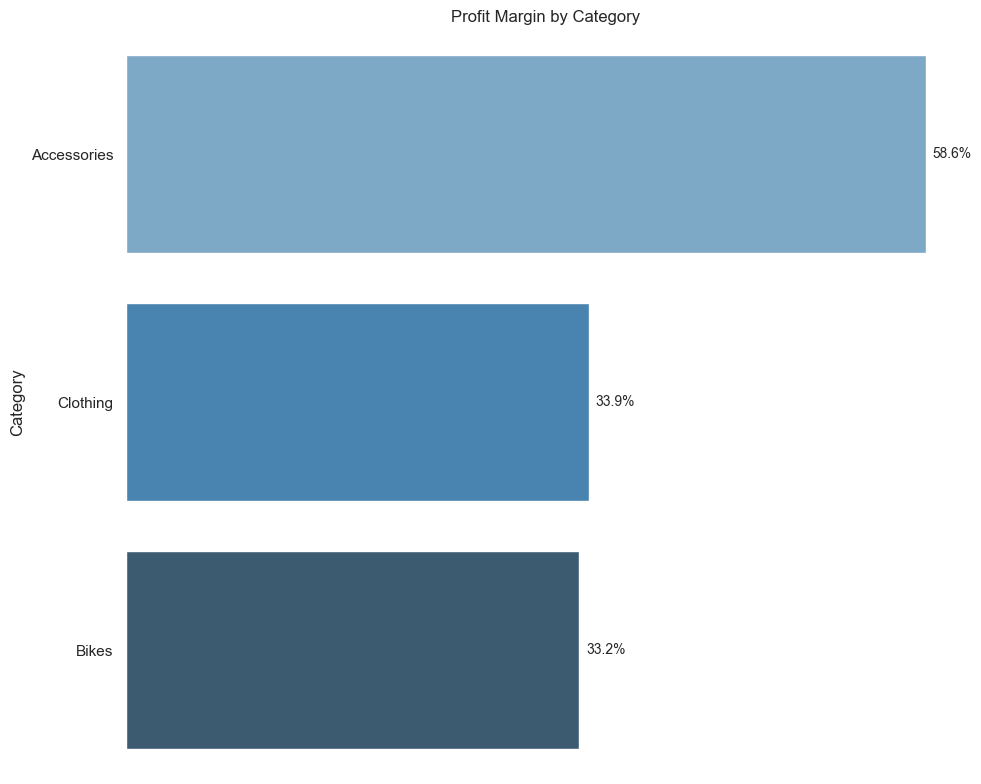

In [49]:
# Create sorted DataFrame
margin_df = pd.DataFrame(list(margin_cat.items()), columns=['category', 'margin'])
margin_df['margin_pct'] = margin_df['margin'] * 100
margin_df = margin_df.sort_values('margin', ascending=False)

plt.figure(figsize=(10, 8))

ax = sns.barplot(
    data=margin_df,
    x='margin_pct',
    y='category',
    order=margin_df['category'],
    palette='Blues_d'
)

for bar in ax.patches:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2
    ax.text(width + 0.5, y, f"{width:.1f}%", va='center', ha='left', fontsize=10)

# Hide x-axis
ax.set_xlabel("")
ax.set_xticks([])
plt.title("Profit Margin by Category")
plt.ylabel("Category")
plt.tight_layout()
plt.box(False)
plt.show()

In [50]:
# Products
margin_products = {}
for product in df['product'].unique():
    df_product = df[df['product']== product]
    margin_products[product] = df_product.profit.sum()/df_product.revenue.sum()

margin_df_product = pd.DataFrame(list(margin_products.items()), columns=['product', 'margin'])
margin_df_product['margin_pct'] = margin_df_product['margin'] * 100
margin_df_product = margin_df_product.sort_values('margin', ascending=False)

In [51]:
margin_df_product.head(5)

,product,margin,margin_pct
99,Road Tire Tube,0.724936,72.493576
92,"Racing Socks, L",0.634759,63.475949
93,"Racing Socks, M",0.631948,63.194757
4,Road Bottle Cage,0.628393,62.839326
7,Fender Set - Mountain,0.601164,60.116374


In [52]:
margin_df_product.tail(5)

,product,margin,margin_pct
5,AWC Logo Cap,0.142034,14.203416
18,"Short-Sleeve Classic Jersey, S",0.133019,13.301874
15,"Short-Sleeve Classic Jersey, XL",0.131681,13.168100
16,"Short-Sleeve Classic Jersey, L",0.128998,12.899783
17,"Short-Sleeve Classic Jersey, M",0.102301,10.230073


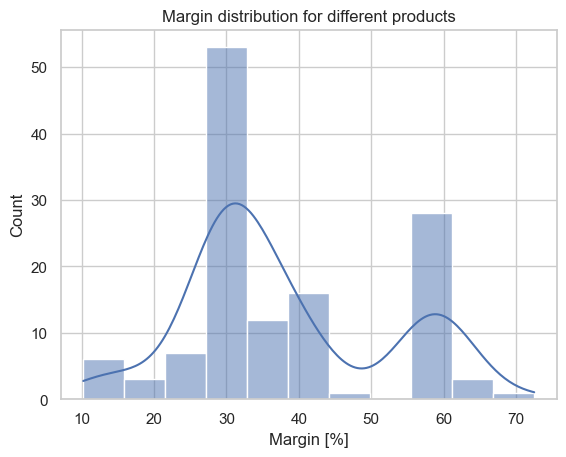

In [53]:
sns.histplot(data = margin_df_product, x='margin_pct', kde = True)
plt.xlabel('Margin [%]')
plt.title('Margin distribution for different products');

In [54]:
df_orders = df.groupby('product')[['order_quantity','profit']].sum().reset_index()
margin_df_product = margin_df_product.merge(df_orders, how = 'left', on = 'product')

In [55]:
total_profit = margin_df_product['profit'].sum()

def plot_dual_bars(df, title):
    df = df.copy()
    df['profit_share'] = df['profit'] / total_profit

    plt.figure(figsize=(12, 6))

    bar_height = 0.35
    y = np.arange(len(df))

    bars1 = plt.barh(y + bar_height/2, df['margin'], height=bar_height, color='#4c72b0', label='Profit Margin')
    bars2 = plt.barh(y - bar_height/2, df['profit_share'], height=bar_height, color='#dd8452', label='Profit Share')

    for bar in bars1:
        width = bar.get_width()
        plt.text(width + 0.005, bar.get_y() + bar.get_height()/2, f"{width*100:.1f}%", 
                 va='center', ha='left', fontsize=10)

    for bar in bars2:
        width = bar.get_width()
        plt.text(width + 0.005, bar.get_y() + bar.get_height()/2, f"{width*100:.1f}%", 
                 va='center', ha='left', fontsize=10)

    plt.yticks(y, df['product'])
    plt.xlabel("")
    plt.xticks([])
    plt.title(title, fontsize = 12, fontweight = 'bold')
    plt.legend(loc='lower right')
    plt.box(False)
    plt.grid(False)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.savefig(title, dpi=300)

    plt.show()


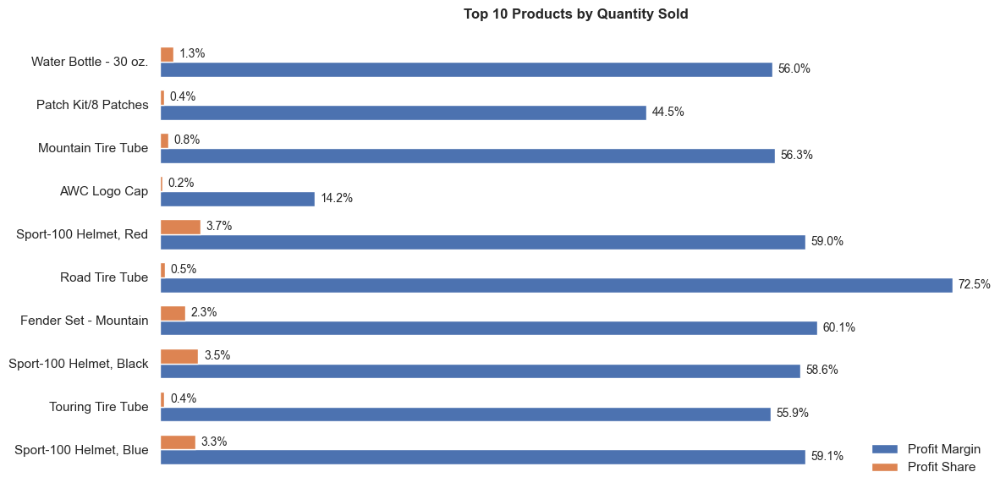

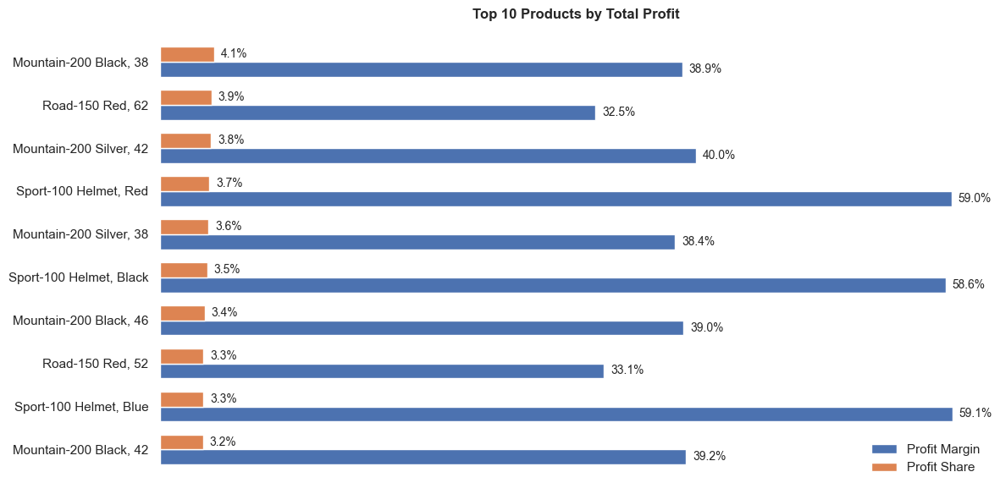

In [56]:
top10_qty = margin_df_product.sort_values('order_quantity', ascending=False).head(10)
plot_dual_bars(top10_qty, "Top 10 Products by Quantity Sold")

top10_profit = margin_df_product.sort_values('profit', ascending=False).head(10)
plot_dual_bars(top10_profit, "Top 10 Products by Total Profit")

## Highlights and Insights

- The data seems to show some type of **seasonality every 2 years**.
- **July consistently has the lowest average sales**, while **December has the highest**. There is an overall trend of increased sales throughout the year, except for July.
- The years **2014 and 2016 were very similar** and showed a **"gap" in the second half of the year**. This could indicate missing data or an operational issue.
- **2013 and 2015 started slow** but **accelerated in the second half**. A similar pattern seems to occur in 2014 and 2016, though with a slight drop.
- Over time, **order quantity increased slowly while profit increased faster**, suggesting that **higher-priced items were sold**.
- In terms of age distribution, **adults aged 25–34 and 35–64** generate the **most orders and profit**. **Seniors and younger customers** are underrepresented and could offer growth opportunities.
- The **U.S. has maintained order volume while increasing profit per order**. Other countries could benefit from replicating this approach.
- **Australia saw a noticeable drop in sales in 2014 and 2016**, suggesting potential operational or market issues.
- **Accessories represent 4x the volume of clothing**, but **30x less than bicycles**. In contrast, **bicycles generate more than 2x the profit of accessories and over 7x that of clothing**.
- **Profit margins increased from 32% to 39% starting in 2013**.
- Products contributing most to profits had **moderate margins (35–40%)** but **high price tags**. Pairing these with lower-margin items could optimize overall margin.
- Most subcategories maintained stable performance, except for **bicycles, which show a growing trend**. This category could benefit from add-on kits and promotions.

---

## Suggested Actions

- **Implement Early-Year Discounts**: Boost sales during slower months like July by offering stronger discounts in Q1.
- **Investigate Sales Gaps in 2014 and 2016**: Analyze the missing or weak data in the second half of these years to understand what went wrong.
- **Target Young and Senior Segments**: Develop campaigns aimed at younger (<25) and older (65+) demographics to tap into underserved markets.
- **Replicate U.S. Strategies Globally**: Study and adapt U.S. tactics to improve profit per order in other countries.
- **Address Australia's Sales Drop**: Deep dive into operational, economic, or marketing issues in Australia during 2014 and 2016.
- **Create Product Kits**: Bundle high-volume items (e.g., tires, water bottles) with high-profit accessories (e.g., socks, helmets, fenders).
- **Leverage Bicycle Growth**: Promote bicycle-related products and add-ons to capitalize on the growing interest in this category.
- **Optimize Product Mix**: Sell high-priced, moderate-margin products alongside low-cost items to maximize margin.
- **Monitor and Sustain Profitability**: Keep tracking margins by product and category and test strategies to maintain or boost them.
